<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#Import-of-libraries-and-data-loading" data-toc-modified-id="Import-of-libraries-and-data-loading-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Import of libraries and data loading</a></span></li><li><span><a href="#Data-preprocessing-and-explarotary-analysis" data-toc-modified-id="Data-preprocessing-and-explarotary-analysis-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data preprocessing and explarotary analysis</a></span><ul class="toc-item"><li><span><a href="#First-look-at-data" data-toc-modified-id="First-look-at-data-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span><strong>First look at data</strong></a></span></li><li><span><a href="#Data-preprocessing-and-exploratory-analysis" data-toc-modified-id="Data-preprocessing-and-exploratory-analysis-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Data preprocessing and exploratory analysis</a></span></li></ul></li><li><span><a href="#Modelling" data-toc-modified-id="Modelling-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Modelling</a></span><ul class="toc-item"><li><span><a href="#Model-specification" data-toc-modified-id="Model-specification-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Model specification</a></span></li><li><span><a href="#multiculliniarity-and-heteroskedasticity-analysis" data-toc-modified-id="multiculliniarity-and-heteroskedasticity-analysis-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>multiculliniarity and heteroskedasticity analysis</a></span></li></ul></li></ul></div>

## Introduction

**Task description**

Many people know about marketplaces where second-hand items are sold, where it is possible to buy a high-quality and useful item inexpensively. But the question always worries - who and how sets the price, and what characteristics of it affect the final cost of the sale ?! 

The issue becomes especially relevant when it comes to expensive goods, such as cars!

The goal of this project will be to develop a model for predicting the cost of a car in the secondary market.

In the course of work, all the main stages of a full-fledged study will be covered:

- downloading and accessing data
- Preliminary processing
- full exploratory analysis
- development of new synthetic traits
- multicollinearity test
- selection of the final set of training features
- selection and training of models
- final assessment of the prediction quality of the best model
- analysis of the importance of its features
- creation of a web application prototype of the model using the Streamlit library
- Preparation of a research report

**Data columns**

- Date: Year of manufacture of the car.
- Make: Make of the car.
- Model: An edition of a particular brand of car.
- Trim: The trim levels of a car are just different versions of the model.
- Body: Vehicle body type refers to the shape and model of a specific brand of vehicle.
- Transmission: The mechanism that transfers power from the engine to the wheels.
- VIN: vehicle identification number.
- State: The state in which the vehicle is auctioned.
- Condition: The condition of the vehicles at the time of the auction.
- Odometer: The distance the vehicle has traveled since it was released.
- Color: Car body color.
- Interior: The interior color of the car.
- Seller: Car dealer, car dealerships.
- sellingprice: The price at which the vehicle was sold at auction.
- saledate: The date the vehicle was sold.

## Import of libraries and data loading

In [1]:
!pip install isort
!pip install ydata_profiling
!pip install scikit-learn==1.1.3
!pip install category_encoders
!pip install xgboost

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re

import ydata_profiling
import category_encoders as ce

from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score,RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, RobustScaler
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.feature_selection import SelectKBest,RFE

from category_encoders import LeaveOneOutEncoder
from scipy import stats as st
from datetime import timedelta
from statsmodels.stats.diagnostic import het_breuschpagan
from xgboost import XGBRegressor
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_white
import statsmodels.api as sm

In [3]:
pd.set_option('display.float_format','{:,}'.format)
pd.set_option('display.precision',2)

In [4]:
df_train_1 = pd.read_csv('train.csv')    
df_test_1 = pd.read_csv('test.csv')

In [5]:
rand_st = np.random.RandomState(12345)

## Data preprocessing and explarotary analysis

The following number of issues will be checked during this stage:

- data types
- Explicit and Implicit Duplicates in Data
- data omissions 
- necessity for feature coding
- necessity for developing new features

### **First look at data**

In [ ]:
print('train dataset')
print()
df_train_1.info()
ydata_profiling.ProfileReport(df_train_1)


train dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440236 entries, 0 to 440235
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          440236 non-null  int64  
 1   make          432193 non-null  object 
 2   model         432113 non-null  object 
 3   trim          431899 non-null  object 
 4   body          429843 non-null  object 
 5   transmission  388775 non-null  object 
 6   vin           440236 non-null  object 
 7   state         440236 non-null  object 
 8   condition     430831 non-null  float64
 9   odometer      440167 non-null  float64
 10  color         439650 non-null  object 
 11  interior      439650 non-null  object 
 12  seller        440236 non-null  object 
 13  sellingprice  440236 non-null  int64  
 14  saledate      440236 non-null  object 
dtypes: float64(2), int64(2), object(11)
memory usage: 50.4+ MB


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
print('test dataset')
print()
df_test_1.info() 
ydata_profiling.ProfileReport(df_test_1)

test dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110058 entries, 0 to 110057
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          110058 non-null  int64  
 1   make          107997 non-null  object 
 2   model         107979 non-null  object 
 3   trim          107944 non-null  object 
 4   body          107464 non-null  object 
 5   transmission  97047 non-null   object 
 6   vin           110058 non-null  object 
 7   state         110058 non-null  object 
 8   condition     107679 non-null  float64
 9   odometer      110039 non-null  float64
 10  color         109900 non-null  object 
 11  interior      109900 non-null  object 
 12  seller        110058 non-null  object 
 13  saledate      110058 non-null  object 
dtypes: float64(2), int64(1), object(11)
memory usage: 11.8+ MB


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

After a quick look at the data the following conclusions can be riched:

- there are no Duplicate rows in both training and test datasets
- the only column with unique values ('Vin' column) does not have any explicit duplicates
- all types of data (categorical, ordinal, interval and ratio) are present in the datasets. This data structure will impact data coding procedures
- for some columns data types are misspecified
- there are missing values for a number of features
- distributions of features are not normal. This may lead to heteroskedasticity in the final model
- high correlations are present between some features (it may result in multiciculliniarity)
- there are implicit duplicates in a number of non-numerical rows
- there are extreme and rare values in a number of columns

### Data preprocessing and exploratory analysis

**Changing of data types**

String columns will be changed to 'String' and numerical columns to 'float'. "Transmission" column should have bool data type since only two different values are present in the column. "Saledate" and "year" columns will be tranformed into datetime columns.

In [8]:
to_bool = ['transmission']
to_string = ['make','model','trim','body','vin','state','color','interior','seller']
to_float = ['condition','odometer']
to_datetime = ['saledate','year']

type_list = [to_float,to_string]

In [9]:
for each in type_list:
    for i in each:
        if i in to_float:
            df_train_1[i] = df_train_1[i].astype('float')
            df_test_1[i] = df_test_1[i].astype('float')
        if i in to_string:
            df_train_1[i] = df_train_1[i].astype('string')
            df_test_1[i] = df_test_1[i].astype('string')

df_train_1['sellingprice'] = df_train_1['sellingprice'].astype('float')

In [10]:
df_train_1.replace(['automatic','manual'],[1,0],inplace = True)
df_test_1.replace(['automatic','manual'],[1,0],inplace = True)

df_train_1['transmission'] = df_train_1['transmission'].astype('bool')
df_test_1['transmission'] = df_test_1['transmission'].astype('bool')

In [11]:
df_train_1.rename(columns={'transmission':'is_automatic'},inplace=True)
df_test_1.rename(columns={'transmission':'is_automatic'},inplace=True)

In [12]:
df_train_1['saledate'] = df_train_1['saledate'].str.slice(start=4, stop=15)
df_test_1['saledate'] = df_test_1['saledate'].str.slice(start=4, stop=15)

In [13]:
df_train_1['saledate'] = pd.to_datetime(df_train_1['saledate'],
               format='%b %d %Y')
df_test_1['saledate'] = pd.to_datetime(df_test_1['saledate'],
               format='%b %d %Y')

In [14]:
df_train_1['year'] = pd.to_datetime(df_train_1['year'],
               format='%Y')
df_test_1['year'] = pd.to_datetime(df_test_1['year'],
               format='%Y')

**Improvement of case sensitive duplicates**

The easiest to find and correct duplicates will be corrected by transforming string data columns to lower case.

In [15]:
for each in to_string:
    df_train_1[each] = df_train_1[each].str.lower()
    
    df_test_1[each] = df_test_1[each].str.lower()

**Feature engineering**

New date features will be constructed to check if age of the car, month or weekend have any impact on the price.

In [16]:
df_train_1['age'] = df_train_1['saledate'].dt.year - df_train_1['year'].dt.year
df_train_1['month_of_sale'] = df_train_1['saledate'].dt.month
df_train_1['is_weekend'] = df_train_1['saledate'].dt.dayofweek.isin([5, 6])


In [17]:
df_test_1['age'] = df_test_1['saledate'].dt.year - df_test_1['year'].dt.year
df_test_1['month_of_sale'] = df_test_1['saledate'].dt.month
df_test_1['is_weekend'] = df_test_1['saledate'].dt.dayofweek.isin([5, 6])

**Handling extreme and rare values**

Extreme values of numeric columns will be handled in this section

In [18]:
df_train_1.columns

Index(['year', 'make', 'model', 'trim', 'body', 'is_automatic', 'vin', 'state',
       'condition', 'odometer', 'color', 'interior', 'seller', 'sellingprice',
       'saledate', 'age', 'month_of_sale', 'is_weekend'],
      dtype='object')

In [19]:
pair_df = df_train_1.drop(columns = ['make', 'model', 'trim', 'body', 
                                     'vin', 'state','color', 'interior', 'seller'],axis=1)

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


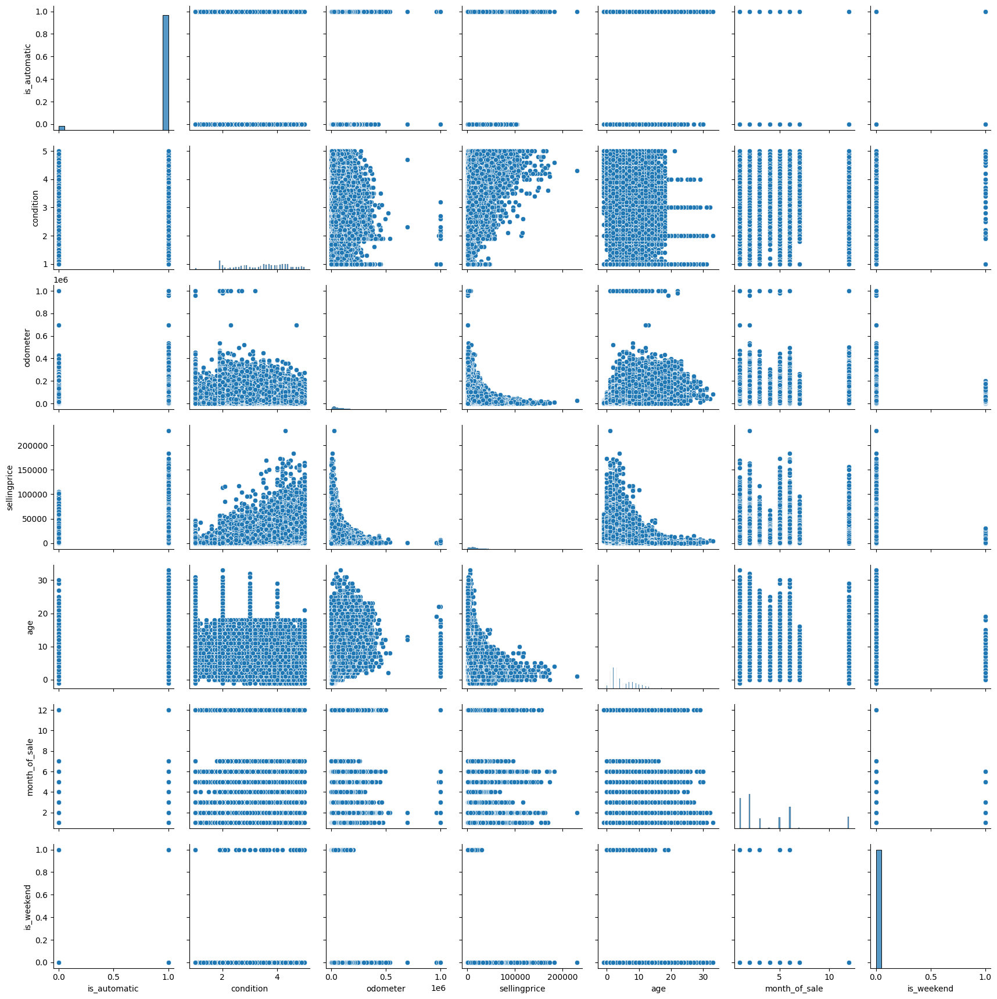

In [20]:
sns.pairplot(pair_df)


Interesting attributes of numeric features pair distributions:

- is_automatic has almost no relationship with any other numeric column
- condition column has some liniar relationship with sellingprice
- odometer column has log liniar relationship with selling price, some relationship with weekend sale date where more cars with high odometer value were sold during weekdays rather than weekends
- age has similar relationship with weekends as odometer column and some non_liniar relationship with selling price
- month of sale has almost no relationship with other columns
- additionally, is_weekend column has some relationship with selling price which can be described as higher selling price for weekdays rather than for weekend days.

A log tranformation will be performed on a target during modelling stage to check if it enhances predictability of the model.

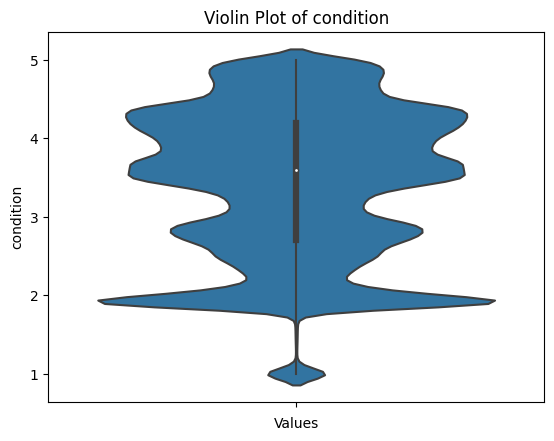

count            430,831.0
mean     3.425076654186909
std     0.9499730770974647
min                    1.0
25%                    2.7
50%                    3.6
75%                    4.2
max                    5.0
Name: condition, dtype: float64


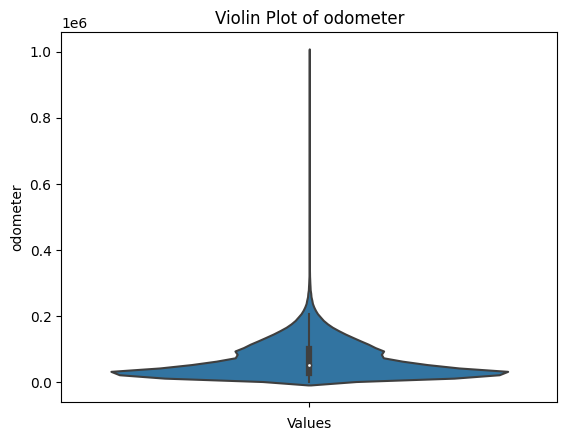

count            440,167.0
mean    68,344.42160361863
std     53,542.20390763895
min                    1.0
25%               28,258.0
50%               52,098.0
75%               99,272.0
max              999,999.0
Name: odometer, dtype: float64


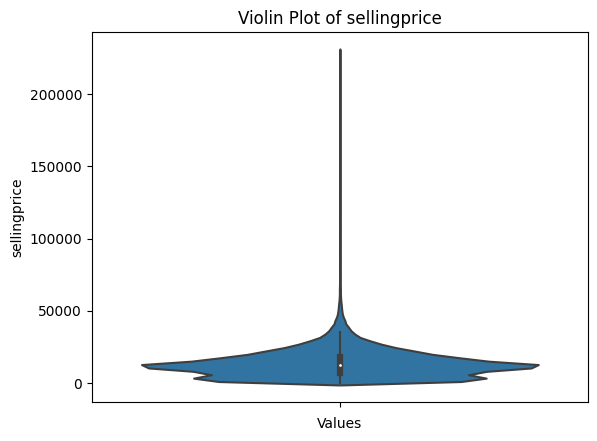

count            440,236.0
mean    13,592.20958758484
std      9,751.47909770946
min                    1.0
25%                6,900.0
50%               12,100.0
75%               18,200.0
max              230,000.0
Name: sellingprice, dtype: float64


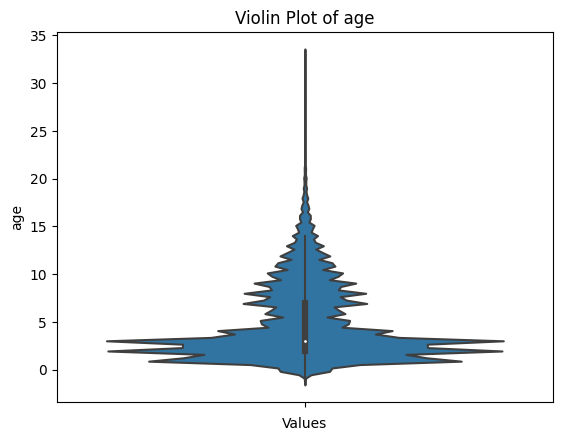

count            440,236.0
mean     4.862410161822296
std     3.9543868540075438
min                   -1.0
25%                    2.0
50%                    3.0
75%                    7.0
max                   33.0
Name: age, dtype: float64


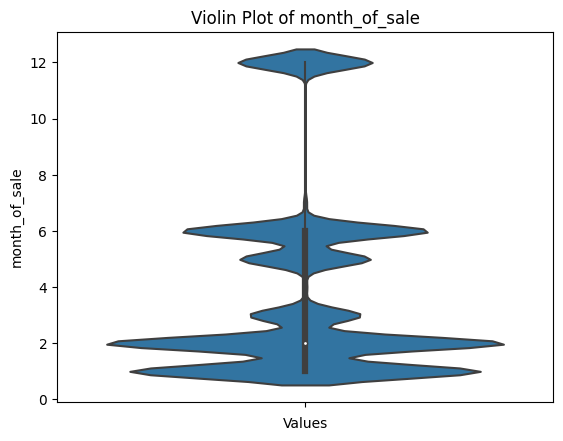

count            440,236.0
mean     3.817600105398014
std     3.2455987687146126
min                    1.0
25%                    1.0
50%                    2.0
75%                    6.0
max                   12.0
Name: month_of_sale, dtype: float64


In [21]:
num = ['condition', 'odometer', 'sellingprice','age', 'month_of_sale']
for col in num:
      
    sns.violinplot(y=df_train_1[col])
    plt.xlabel('Values')
    plt.title(f'Violin Plot of {col}')
    plt.show()
    print(df_train_1[col].describe())  

- Values of a condition and month of sale variables are more or less equally distributed where median and mean are close to each other
- Odometer, age and selling price columns distributions have a very fat right tail represented by several extreme values. This problem should be examined separately. Additionally, the age column has negative values and selling price has a value of 1.

**Odometer column analysis**

In [22]:
df_odo = df_train_1.loc[df_train_1['odometer'] > 800000]

In [23]:
display(df_odo)

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
6069,2012-01-01,hyundai,sonata,gls,sedan,True,5npeb4ac6ch429831,oh,1.0,"999,999.0",white,gray,santander consumer,800.0,2015-01-06,3,1,False
11122,2004-01-01,chevrolet,tahoe,ls,suv,True,1gnec13v34j247109,ga,1.9,"999,999.0",black,tan,santander consumer,"1,800.0",2015-01-06,11,1,False
12368,2006-01-01,mazda,tribute,i,suv,True,4f2yz02z26km30632,fl,2.0,"999,999.0",white,tan,santander consumer,"1,200.0",2015-02-09,9,2,False
14897,2006-01-01,kia,amanti,base,sedan,True,knald124265085150,ms,1.0,"999,999.0",gray,beige,fiserv/global lending services,800.0,2014-12-18,8,12,False
17341,1996-01-01,toyota,corolla,base,sedan,True,2t1ba02e0tc143572,fl,1.0,"959,276.0",blue,gray,coggin honda of ft pierce,500.0,2015-02-17,19,2,False
26602,2005-01-01,nissan,quest,3.5 se,minivan,True,5n1bv28u15n131795,il,1.9,"999,999.0",green,gray,santander consumer,"2,600.0",2014-12-30,9,12,False
45730,2001-01-01,chevrolet,silverado 1500,ls,extended cab,True,1gcec19v81z169441,ca,1.0,"999,999.0",white,black,800 loan mart,"1,500.0",2015-05-28,14,5,False
66088,2009-01-01,chevrolet,cobalt,lt,coupe,True,1g1at18h797165360,tx,NaN,"999,999.0",white,gray,mei finance,400.0,2014-12-18,5,12,False
78696,2006-01-01,nissan,quest,3.5 se,minivan,True,5n1bv28u26n123304,md,2.7,"999,999.0",white,beige,santander consumer,"2,800.0",2015-02-24,9,2,False
79958,2011-01-01,nissan,altima,2.5 s,sedan,True,1n4al2ap1bn503809,ms,2.3,"999,999.0",blue,black,gm financial,"4,000.0",2015-05-14,4,5,False


Extreme odometer values correspond to low prices and low condition which is logical. It would be incorrect to delete or change extreme odometer values bacause they represent important features of a database and should be used for model training.

In [24]:
df_odo = df_train_1.loc[df_train_1['odometer'] < 1000]
display(df_odo)

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
125,2000-01-01,jeep,cherokee,sport,suv,True,1j4ff48s5yl232779,ny,3.1,1.0,blue,gray,morehead auto sales inc,300.0,2015-01-21,15,1,False
212,2007-01-01,gmc,yukon,sle,suv,True,1gkfc13027r215974,tx,2.1,1.0,black,black,shamaley buick gmc,"10,000.0",2015-01-22,8,1,False
270,2000-01-01,nissan,altima,gxe,sedan,True,1n4dl01d1yc126300,nv,2.0,1.0,black,—,titlemax of eastern ave. - nv 7,800.0,2015-03-05,15,3,False
335,2015-01-01,nissan,altima,2.5 s,sedan,True,1n4al3ap3fc204863,tx,5.0,55.0,white,black,rlb investments,"16,800.0",2015-06-17,0,6,False
696,2013-01-01,nissan,pathfinder,sv,suv,True,5n1ar2mm5dc683378,ca,5.0,7.0,silver,gray,nissan north america inc.,"25,750.0",2015-03-03,2,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439309,2015-01-01,toyota,camry,le,sedan,True,4t1bf1fk5fu496335,fl,2.5,2.0,silver,black,florida auto financial group,"29,400.0",2015-07-07,0,7,False
439366,2002-01-01,toyota,camry,se,sedan,True,jtdbe32k120127949,il,NaN,1.0,gray,—,grossinger city toyota,"2,850.0",2014-12-18,12,12,False
439525,2005-01-01,nissan,quest,3.5 se,minivan,True,5n1bv28u05n119542,fl,2.4,1.0,red,—,mid atlantic finance/clearwater,"4,500.0",2015-06-18,10,6,False
439582,2015-01-01,hyundai,equus,signature,sedan,True,kmhgh4jh5fu100319,tx,5.0,28.0,black,black,hyundai motor america/co car,"46,200.0",2015-06-17,0,6,False


/Users/coldpiold/anaconda3/envs/practicum/lib/python3.9/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/coldpiold/anaconda3/envs/practicum/lib/python3.9/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/coldpiold/anaconda3/envs/practicum/lib/python3.9/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/coldpiold/anaconda3/envs/practicum/lib/python3.9/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/coldpiold/anaconda3/envs/practicum/lib/python3.9/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/col

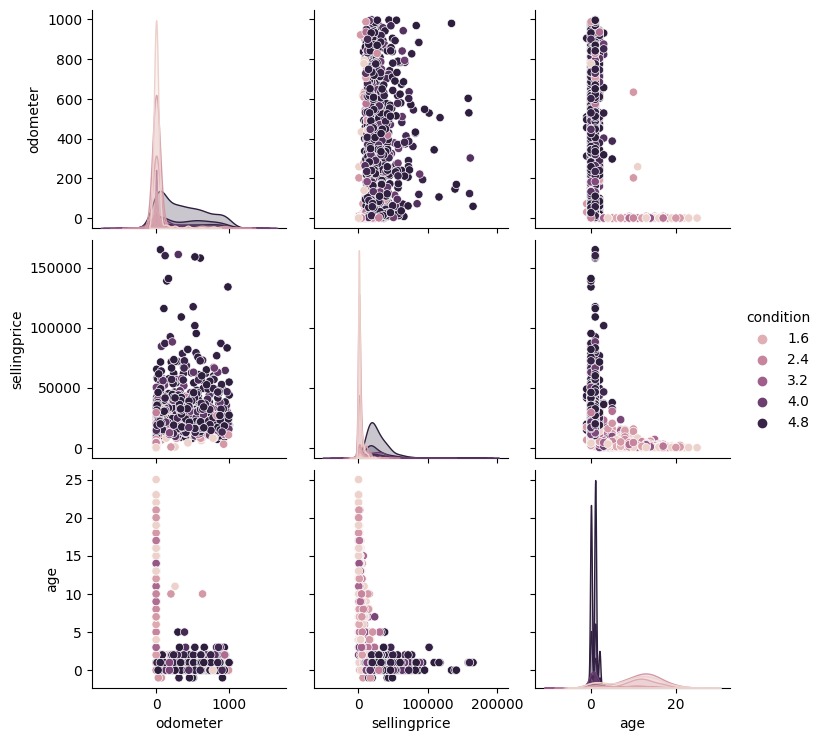

In [25]:
pair_df = df_odo.drop(columns = ['make', 'model', 'trim', 'body', 
                                     'vin', 'state','color', 'interior', 'seller',
                                 'is_automatic','is_weekend','month_of_sale'],axis=1)
sns.pairplot(pair_df,hue='condition')

Additionally, relationsips between numeric columns are examined for cars with low odometer. It was evident before that there is strong negative correlation between price and odometer but this is not the case for cars with low odomter.

- For cars with odometer less than 1000 there is strong correlations between age and price, age and odometer indicating that lower age has lower price and lower odometer. 
- however, there is one more interesting feature of the data: low quality cars typically have the lowest odometer and price and higer age.

**Age column analysis**

In [26]:
display(df_train_1.groupby('year')['age'].count())

year
1982-01-01        1
1983-01-01        1
1984-01-01        4
1985-01-01       10
1986-01-01        8
1987-01-01        5
1988-01-01       11
1989-01-01       15
1990-01-01       38
1991-01-01       56
1992-01-01      103
1993-01-01      168
1994-01-01      319
1995-01-01      567
1996-01-01      683
1997-01-01     1224
1998-01-01     1747
1999-01-01     2658
2000-01-01     4161
2001-01-01     5147
2002-01-01     7726
2003-01-01    10512
2004-01-01    13658
2005-01-01    16794
2006-01-01    21118
2007-01-01    24152
2008-01-01    24646
2009-01-01    16064
2010-01-01    20647
2011-01-01    38115
2012-01-01    80625
2013-01-01    77566
2014-01-01    64225
2015-01-01     7462
Name: age, dtype: int64

In [27]:
df_age = df_train_1.loc[df_train_1['age'] < 0]
display(df_age)
display(df_age.groupby('year')['age'].count())
display(df_age.groupby('saledate')['age'].count())
display(df_age.groupby('seller')['age'].count())

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
1036,2015-01-01,hyundai,elantra,se,sedan,True,5npdh4ae2fh553630,ca,NaN,"9,750.0",blue,gray,avis rac/san leandro,"10,000.0",2014-12-16,-1,12,False
2238,2015-01-01,nissan,altima,2.5 s,sedan,True,1n4al3ap5fn318335,pa,1.0,"9,399.0",red,black,enterprise veh exchange/rental,"3,600.0",2014-12-30,-1,12,False
3320,2015-01-01,nissan,altima,2.5 s,sedan,True,1n4al3ap4fn313644,ca,NaN,"10,678.0",gray,black,enterprise vehicle exchange / tra / rental / t...,"11,600.0",2014-12-18,-1,12,False
6256,2015-01-01,chevrolet,suburban,lt,suv,True,1gnskjkc4fr157915,md,4.5,"15,129.0",gray,black,enterprise veh exchange/rental,"47,000.0",2014-12-23,-1,12,False
7036,2015-01-01,hyundai,elantra,se,sedan,True,5npdh4ae3fh580092,tx,NaN,"12,331.0",silver,black,tdaf remarketing,"13,900.0",2014-12-17,-1,12,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429769,2015-01-01,hyundai,elantra,se,sedan,True,5npdh4ae2fh565969,ca,1.0,"7,879.0",silver,gray,enterprise vehicle exchange / tra / rental / t...,"10,500.0",2014-12-16,-1,12,False
430103,2015-01-01,hyundai,elantra,se,sedan,True,5npdh4ae7fh591578,fl,NaN,"3,163.0",blue,gray,enterprise vehicle exchange / tra / rental / t...,"4,400.0",2014-12-22,-1,12,False
430530,2015-01-01,nissan,altima,2.5 s,sedan,True,1n4al3ap5fc124223,ca,2.0,"11,398.0",black,black,enterprise vehicle exchange / tra / rental / t...,"14,100.0",2014-12-23,-1,12,False
437121,2015-01-01,chevrolet,tahoe,ltz,suv,True,1gnskckc7fr293905,wi,5.0,"1,102.0",black,black,robert preussler motors llc,"58,500.0",2014-12-23,-1,12,False


year
2015-01-01    166
Name: age, dtype: int64

saledate
2014-01-01     1
2014-01-06     3
2014-12-16    22
2014-12-17     9
2014-12-18    33
2014-12-19    10
2014-12-22     5
2014-12-23    30
2014-12-30    39
2014-12-31    14
Name: age, dtype: int64

seller
ag leaseplan                                           1
amro -auction sale unit                                1
ars/enterprise                                         3
ars/express car and truck rental inc                   1
audi north scottsdale                                  2
audi san diego                                         1
avis rac/damage/charlotte                              2
avis rac/los angeles                                   1
avis rac/san leandro                                   1
avis rent a car/pv holding                             1
avis tra                                               3
bmw north america greer                               16
capps rent a car                                       4
chrysler capital                                       1
dollar thrifty/tra                                     1
dtag tra                                               1
ec sales,llc                                           1
enterprise veh exchange/

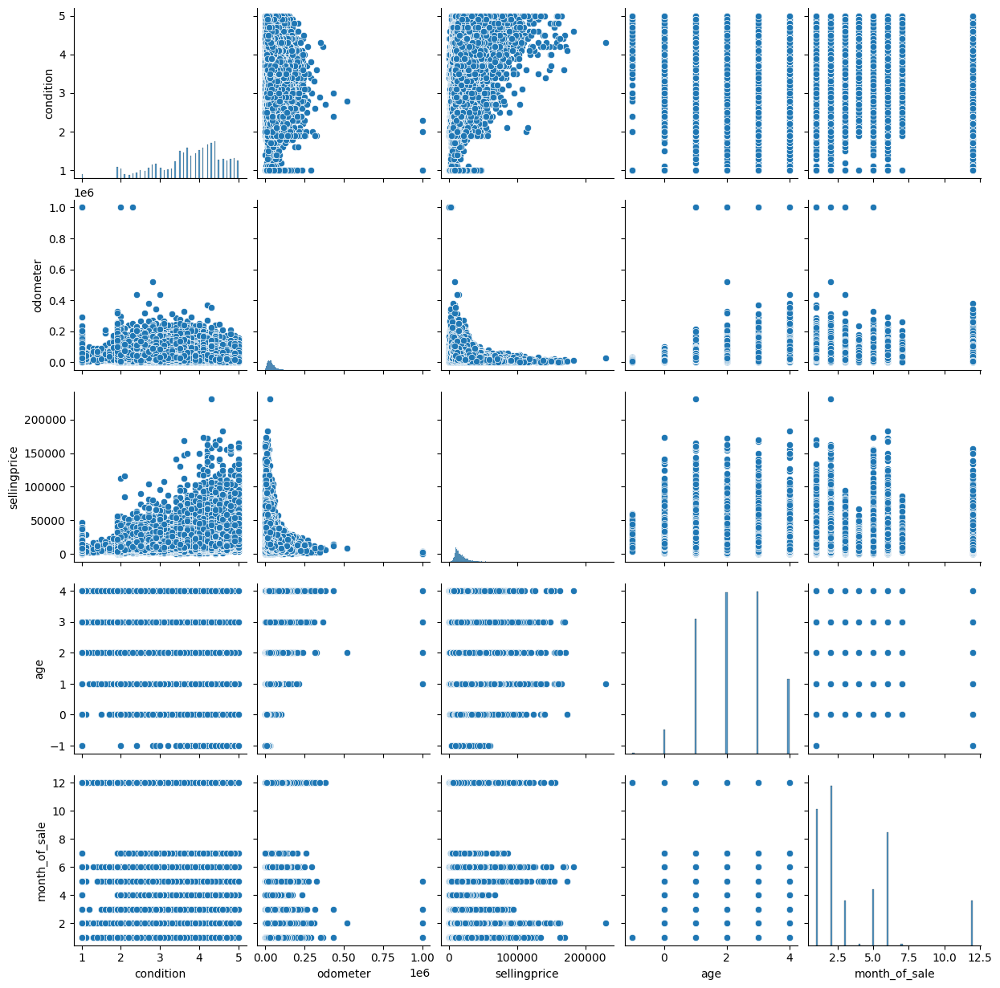

In [28]:
df_age = df_train_1.loc[df_train_1['age'] < 5]
pair_df = df_age.drop(columns = ['make', 'model', 'trim', 'body', 
                                     'vin', 'state','color', 'interior', 'seller',
                                 'is_automatic','is_weekend'],axis=1)
sns.pairplot(pair_df)

The problem of negative age stem from incorrect data filling since year of manufacturing comes before sale date. Year of manufecturing is the same for all incorrect age entries (2015) and it is the maximum value for the whole train dataframe.

The only clue for mistake correction is high positive correlation between age and odometer (all negative age cars have low odomter values). To correct for this 2015 year of manufecturing will be replaced with 2014.

In [29]:
mlist = ['ford',
 'nissan',
 'hummer',
 'lincoln',
 'pontiac',
 'hyundai',
 'buick',
 'chevrolet',
 'honda',
 'acura',
 'cadillac',
 'gmc',
 'saab',
 'dodge',
 'mercedes-benz',
 'toyota',
 'volkswagen',
 'bmw',
 'infiniti',
 'chrysler',
 'kia',
 'jaguar',
 'subaru',
 'jeep',
 'lexus',
 'mercedes',
 'scion',
 'fiat',
 'suzuki',
 'mazda',
 'volvo',
 'audi',
 'mini',
 'isuzu',
 'mitsubishi',
 'smart',
 'porsche',
 'land rover',
 'saturn',
 'ram',
 'oldsmobile',
 'mercury',
 'bentley',
 'fisker',
 'maserati',
 'tesla',
 'landrover',
 'vw',
 'gmc truck',
 'rolls-royce',
 'ferrari',
 'plymouth',
 'lamborghini',
 'geo',
 'ford truck',
 'aston martin',
 'daewoo',
 'mercedes-b',
 'dodge tk',
 'mazda tk',
 'dot',
 'airstream']

In [30]:
df_make = df_train_1.copy()
df_make['make'].replace(to_replace = mlist,value = 1,inplace = True)
df_make['make'] = df_make['make'].fillna(0)
display(df_make.loc[df_make['age'] > 30].head())
df_make['make'] = df_make['make'].astype('float')
print(df_make.groupby('age')['make'].mean())

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
106264,1983-01-01,0,<NA>,<NA>,<NA>,True,wdbba45a2db024033,fl,3.0,"42,697.0",black,tan,coconut creek auto mall,"5,250.0",2015-02-26,32,2,False
191684,1984-01-01,0,<NA>,<NA>,<NA>,True,1g1ay0786e5117884,fl,1.0,"122,136.0",blue,gray,d&a fine cars,"2,600.0",2015-02-10,31,2,False
250627,1982-01-01,0,<NA>,<NA>,<NA>,True,1g1ay0786c5123682,ca,2.0,"85,738.0",gold,gray,livermore toyota and livermore scion,"5,000.0",2015-01-28,33,1,False
309919,1984-01-01,1,corvette,<NA>,<NA>,True,1g1ay0785e5115849,md,2.0,"46,891.0",black,black,darcars chrysler jeep of rockville,"3,100.0",2015-01-06,31,1,False
320566,1984-01-01,0,<NA>,<NA>,<NA>,True,1g1ay0782e5130311,fl,3.0,"136,940.0",silver,black,dyer chevrolet,"2,200.0",2015-02-03,31,2,False


age
-1                    1.0
 0      0.985978441854351
 1     0.9938758991432368
 2     0.9994626888584697
 3     0.9907007469891763
 4      0.992849649384352
 5     0.9807796560051254
 6     0.9914115447534471
 7     0.9860061122728004
 8      0.955808028069003
 9     0.9449376606995585
 10    0.9470355731225296
 11    0.9513810491457816
 12    0.9634649381261049
 13    0.9880576527110501
 14    0.9930362116991643
 15    0.8631578947368421
 16     0.889823717948718
 17    0.8956043956043956
 18    0.8633594429939078
 19     0.890937019969278
 20    0.9083665338645418
 21    0.9096989966555183
 22    0.8580246913580247
 23    0.9139784946236559
 24    0.9803921568627451
 25    0.9117647058823529
 26   0.09090909090909091
 27                   0.0
 28                   0.2
 29                   0.3
 30                   0.0
 31                  0.25
 32                   0.0
 33                   0.0
Name: make, dtype: float64


In [31]:
display(df_train_1.loc[df_train_1['age'] > 25].head())

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
3756,1989-01-01,<NA>,<NA>,<NA>,<NA>,True,wdbba48d3ka094424,mn,2.0,"104,408.0",gray,black,blue ribbon motors,"5,600.0",2015-06-04,26,6,False
6666,1988-01-01,<NA>,<NA>,<NA>,<NA>,True,wdbba48d4ja090137,pa,4.0,"73,111.0",white,brown,r hollenshead auto sales inc,"14,700.0",2015-02-20,27,2,False
7349,1987-01-01,<NA>,<NA>,<NA>,<NA>,True,1g1yy2181h5110249,fl,3.0,"53,122.0",red,red,tdaf remarketing,"5,800.0",2015-02-17,28,2,False
23524,1987-01-01,<NA>,<NA>,<NA>,<NA>,True,wdbea30d0ha434348,tx,3.0,"177,057.0",black,gray,automotive remarketing inc,250.0,2015-01-27,28,1,False
31280,1985-01-01,<NA>,<NA>,<NA>,<NA>,False,1g1yy0780f5125155,pa,2.0,"28,839.0",white,red,remarketing by ge/nextgear capital,"5,100.0",2015-06-19,30,6,False


Intresting that from 70% to 90% of maker and model data for 25+ ages cars is unknown. The only clue for the model of the car is the name of seller. But it can be seen clearly thay name of a car sold sometimes do not correspond to a seller name.

**Sellingprice column analysis**

In [32]:
display(df_train_1.loc[df_train_1['sellingprice'] < 100])

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
137962,2003-01-01,mercedes-benz,e-class,e500,sedan,True,wdbuf70j73a269529,ga,2.1,1.0,black,black,peoples credit company inc,1.0,2015-01-06,12,1,False
418021,2002-01-01,ford,f-350 super duty,xlt,crew cab,True,1ftsw31f52ed16477,ca,2.0,NaN,white,gray,laa leasing,1.0,2015-02-05,13,2,False


In [33]:
mean_price = df_train_1['sellingprice'].loc[(df_train_1['age'] > 10) & 
                       (df_train_1['model'] == 'e-class')&
                      (df_train_1['trim'] == 'e500')&
                      (df_train_1['condition'] == 2.1)&
                      (df_train_1['odometer'] != 1)].mean()

df_train_1.loc[(df_train_1['sellingprice'] < 100)& 
                       (df_train_1['model'] == 'e-class'),'sellingprice'] = mean_price

In [34]:
mean_price = df_train_1.loc[(df_train_1['make'] == 'ford')&
                      (df_train_1['age']>10)&
                      (df_train_1['body'] == 'crew cab')&
                      (df_train_1['trim'] == 'xlt')&
                      (df_train_1['condition'] == 2.0)&
                      (df_train_1['model'] != 'explorer sport trac')&
                       ~(df_train_1['odometer'].isnull()),'sellingprice'].mean()

df_train_1.loc[(df_train_1['sellingprice'] < 100)& 
                       (df_train_1['model'] == 'f-350 super duty'),'sellingprice'] = mean_price

Unusually low prices were replaced with mean prices of same model cars with similar condition and odometer.

**Handling missing values**

In [35]:
ydata_profiling.ProfileReport(df_train_1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

It seems that null values in make,model,trim and body columns are highly correlated. This data may come from particular data providers or lost. It should be checked agaist the last non numeric column - Seller.

In [36]:
temp = df_train_1.loc[(df_train_1['make'].isnull())&
                    (df_train_1['model'].isnull())&
                    (df_train_1['trim'].isnull())&
                    (df_train_1['body'].isnull())].copy()

In [37]:
temp

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
10,2007-01-01,<NA>,<NA>,<NA>,<NA>,True,5tfbv54157x019560,ca,3.1,"102,507.0",blue,gray,aaero sweet company,"17,250.0",2015-01-29,8,1,False
42,2007-01-01,<NA>,<NA>,<NA>,<NA>,False,jm1bk34l671745431,md,2.8,"92,656.0",blue,gray,credit acceptance corp/vrs/southfield,"5,600.0",2015-06-16,8,6,False
63,2011-01-01,<NA>,<NA>,<NA>,<NA>,True,1fdne1bw5bda64735,ga,5.0,"67,159.0",white,gray,"vpsi, inc","13,200.0",2015-06-04,4,6,False
64,2008-01-01,<NA>,<NA>,<NA>,<NA>,True,1gbdv13wx8d142776,ca,4.1,"113,582.0",white,gray,wholesale motor sales inc,"4,100.0",2015-02-05,7,2,False
111,2006-01-01,<NA>,<NA>,<NA>,<NA>,True,3gnda13d36s611801,nv,2.8,"129,019.0",orange,gray,credit acceptance corp/vrs/southfield,"2,900.0",2015-02-05,9,2,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440085,2011-01-01,<NA>,<NA>,<NA>,<NA>,True,1fdne1bw8bdb21610,az,3.5,"80,594.0",white,gray,mike albert fleet solutions,"11,100.0",2015-02-04,4,2,False
440114,2011-01-01,<NA>,<NA>,<NA>,<NA>,True,2lnbl8ev9bx757689,nj,3.5,"134,164.0",—,black,merchants automotive group,"11,800.0",2015-03-04,4,3,False
440118,2004-01-01,<NA>,<NA>,<NA>,<NA>,True,1gyde637240130408,md,3.5,"123,123.0",white,beige,credit acceptance corp/vrs/southfield,"3,400.0",2015-02-17,11,2,False
440122,2007-01-01,<NA>,<NA>,<NA>,<NA>,True,salme15487a251642,ca,2.5,"39,545.0",black,black,hornburg jaguar,"17,750.0",2015-06-17,8,6,False


It is evident that names of some sellers contain hint on car maker. It means that some absent information may be restored. However, sellers sometimes deal with other car models - this data transformation may be partially missleading but it is better than absence of data. Additionally, there are implicit duplicates in a make column.

In [38]:
list_make = df_train_1['make'].unique().copy()
list_make = list_make.fillna('na')
print(sorted(list_make))

['acura', 'airstream', 'aston martin', 'audi', 'bentley', 'bmw', 'buick', 'cadillac', 'chevrolet', 'chrysler', 'daewoo', 'dodge', 'dodge tk', 'dot', 'ferrari', 'fiat', 'fisker', 'ford', 'ford truck', 'geo', 'gmc', 'gmc truck', 'honda', 'hummer', 'hyundai', 'infiniti', 'isuzu', 'jaguar', 'jeep', 'kia', 'lamborghini', 'land rover', 'landrover', 'lexus', 'lincoln', 'maserati', 'mazda', 'mazda tk', 'mercedes', 'mercedes-b', 'mercedes-benz', 'mercury', 'mini', 'mitsubishi', 'na', 'nissan', 'oldsmobile', 'plymouth', 'pontiac', 'porsche', 'ram', 'rolls-royce', 'saab', 'saturn', 'scion', 'smart', 'subaru', 'suzuki', 'tesla', 'toyota', 'volkswagen', 'volvo', 'vw']


In [39]:
replace = [['ford','ford truck'],
           ['ford','ford tk'],
           ['hyundai', 'hyundai tk'],
           ['land rover', 'landrover'],
           ['mercedes', 'mercedes-benz'],
          ['volkswagen','vw'],
          ['dodge', 'dodge tk'],
          ['gmc', 'gmc truck'],
          ['mazda', 'mazda tk'],
          ['mercedes', 'mercedes-b'],
          ['chevrolet','chev truck']]

for l in replace:

    df_train_1['make'] = df_train_1['make'].replace(l[1], l[0])
    df_test_1['make'] = df_test_1['make'].replace(l[1], l[0])   

In [40]:
make_list = pd.concat([df_train_1['make'], df_test_1['make']], axis=1)
make_list.columns = ['make1', 'make2']
make_list = pd.melt(make_list, value_vars=['make1', 'make2'])
make_list = make_list.fillna('other')
make_list = make_list['value'].unique().copy()

In [41]:
print(sorted(make_list))

['acura', 'airstream', 'aston martin', 'audi', 'bentley', 'bmw', 'buick', 'cadillac', 'chevrolet', 'chrysler', 'daewoo', 'dodge', 'dot', 'ferrari', 'fiat', 'fisker', 'ford', 'geo', 'gmc', 'honda', 'hummer', 'hyundai', 'infiniti', 'isuzu', 'jaguar', 'jeep', 'kia', 'lamborghini', 'land rover', 'lexus', 'lincoln', 'lotus', 'maserati', 'mazda', 'mercedes', 'mercury', 'mini', 'mitsubishi', 'nissan', 'oldsmobile', 'other', 'plymouth', 'pontiac', 'porsche', 'ram', 'rolls-royce', 'saab', 'saturn', 'scion', 'smart', 'subaru', 'suzuki', 'tesla', 'toyota', 'volkswagen', 'volvo']


In [42]:
def check_unique_words_presence(dataframe, column_name, unique_words):
    found_words = []
    for text in dataframe[column_name]:
        words = [word for word in unique_words if word in text]
        found_words.append(words if words else [])
    dataframe['found_words'] = found_words
    return dataframe

In [43]:
def add_word_count_column(dataframe, column_name, new_column_name):
    word_counts = dataframe[column_name].apply(lambda words:len(words))
    dataframe[new_column_name] = word_counts
    return dataframe

In [44]:
df_train_1 = check_unique_words_presence(df_train_1, 'seller', make_list)
df_test_1 = check_unique_words_presence(df_test_1, 'seller', make_list)

In [45]:
df_train_1 = add_word_count_column(df_train_1, 'found_words', 'word_count_column')
df_test_1 = add_word_count_column(df_test_1, 'found_words', 'word_count_column')

In [46]:
df_train_1

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend,found_words,word_count_column
0,2011-01-01,ford,edge,sel,suv,True,2fmdk3jc4bba41556,md,4.2,"111,041.0",black,black,santander consumer,"12,500.0",2015-06-02,4,6,False,[],0
1,2014-01-01,ford,fusion,se,sedan,True,3fa6p0h75er208976,mo,3.5,"31,034.0",black,black,ars/avis budget group,"14,500.0",2015-02-25,1,2,False,[],0
2,2012-01-01,nissan,sentra,2.0 sl,sedan,True,3n1ab6ap4cl698412,nj,2.2,"35,619.0",black,black,nissan-infiniti lt,"9,100.0",2015-06-10,3,6,False,"[nissan, infiniti]",2
3,2003-01-01,hummer,h2,base,suv,True,5grgn23u93h101360,tx,2.8,"131,301.0",gold,beige,wichita falls ford lin inc,"13,300.0",2015-06-17,12,6,False,[ford],1
4,2007-01-01,ford,fusion,sel,sedan,True,3fahp08z17r268380,md,2.0,"127,709.0",black,black,purple heart,"1,300.0",2015-02-03,8,2,False,[],0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440231,2013-01-01,kia,optima,ex hybrid,sedan,True,knagm4ad4d5057805,ca,4.5,"20,434.0",white,beige,"kia motors america, inc","16,000.0",2015-01-20,2,1,False,[kia],1
440232,2014-01-01,mini,cooper countryman,s all4,wagon,True,wmwzc5c55ewp36517,wi,2.9,"14,675.0",white,black,bmw mini financial services,"24,250.0",2015-02-11,1,2,False,"[bmw, mini]",2
440233,2008-01-01,bmw,6 series,650i,coupe,True,wbaea53588cv90110,ca,3.7,"102,552.0",gray,black,studio city auto group,"16,750.0",2015-03-03,7,3,False,[],0
440234,2014-01-01,ram,2500,slt,crew cab,True,3c6ur5dl2eg243568,tx,3.0,"29,367.0",white,gray,express car & truck rental,"33,000.0",2015-01-14,1,1,False,[],0


In [47]:
df_train_1['found_make'] = df_train_1['found_words'].apply(lambda x: ', '.join([str(i) for i in x]))
df_test_1['found_make'] = df_test_1['found_words'].apply(lambda x: ', '.join([str(i) for i in x]))

In [48]:
df_train_1.loc[(df_train_1['model'].isnull())&
                      (df_train_1['word_count_column']==1)&
              (df_train_1['make'].isnull()),'make'] = df_train_1['found_make']

df_test_1.loc[(df_test_1['model'].isnull())&
                      (df_test_1['word_count_column']==1)&
              (df_test_1['make'].isnull()),'make'] = df_test_1['found_make']

In [49]:
df_train_1.drop(columns = ['found_make','word_count_column','found_words'],axis=1,inplace=True)
df_test_1.drop(columns = ['found_make','word_count_column','found_words'],axis=1,inplace=True)

In [50]:
temp = df_train_1.loc[(df_train_1['make'].isnull())&
                    (df_train_1['model'].isnull())&
                    (df_train_1['trim'].isnull())&
                    (df_train_1['body'].isnull())].copy()
display(temp)

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
10,2007-01-01,<NA>,<NA>,<NA>,<NA>,True,5tfbv54157x019560,ca,3.1,"102,507.0",blue,gray,aaero sweet company,"17,250.0",2015-01-29,8,1,False
42,2007-01-01,<NA>,<NA>,<NA>,<NA>,False,jm1bk34l671745431,md,2.8,"92,656.0",blue,gray,credit acceptance corp/vrs/southfield,"5,600.0",2015-06-16,8,6,False
63,2011-01-01,<NA>,<NA>,<NA>,<NA>,True,1fdne1bw5bda64735,ga,5.0,"67,159.0",white,gray,"vpsi, inc","13,200.0",2015-06-04,4,6,False
64,2008-01-01,<NA>,<NA>,<NA>,<NA>,True,1gbdv13wx8d142776,ca,4.1,"113,582.0",white,gray,wholesale motor sales inc,"4,100.0",2015-02-05,7,2,False
111,2006-01-01,<NA>,<NA>,<NA>,<NA>,True,3gnda13d36s611801,nv,2.8,"129,019.0",orange,gray,credit acceptance corp/vrs/southfield,"2,900.0",2015-02-05,9,2,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440084,2004-01-01,<NA>,<NA>,<NA>,<NA>,True,1g1yy22g445131628,ca,3.6,"76,607.0",blue,beige,auto depot,"14,750.0",2015-02-19,11,2,False
440085,2011-01-01,<NA>,<NA>,<NA>,<NA>,True,1fdne1bw8bdb21610,az,3.5,"80,594.0",white,gray,mike albert fleet solutions,"11,100.0",2015-02-04,4,2,False
440114,2011-01-01,<NA>,<NA>,<NA>,<NA>,True,2lnbl8ev9bx757689,nj,3.5,"134,164.0",—,black,merchants automotive group,"11,800.0",2015-03-04,4,3,False
440118,2004-01-01,<NA>,<NA>,<NA>,<NA>,True,1gyde637240130408,md,3.5,"123,123.0",white,beige,credit acceptance corp/vrs/southfield,"3,400.0",2015-02-17,11,2,False


Missing values for a number of rows in the 'make' column were corrected.

In [51]:
temp = df_test_1.loc[(df_test_1['make'].isnull())&
                    (df_test_1['model'].isnull())&
                    (df_test_1['trim'].isnull())&
                    (df_test_1['body'].isnull())].copy()
display(temp)

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,saledate,age,month_of_sale,is_weekend
22,2006-01-01,<NA>,<NA>,<NA>,<NA>,True,3gnda23d06s523147,pa,2.4,"143,377.0",blue,gray,ryan mtrs of morristown inc,2015-01-23,9,1,False
72,2000-01-01,<NA>,<NA>,<NA>,<NA>,False,1j4fa59s0yp723644,mo,NaN,"76,674.0",black,—,effingham auto care & tire inc,2014-12-22,14,12,False
237,1998-01-01,<NA>,<NA>,<NA>,<NA>,True,1j4gz78yxwc163618,nv,2.0,"243,163.0",gray,—,titlemax/las vegas nv32,2015-02-19,17,2,False
287,2009-01-01,<NA>,<NA>,<NA>,<NA>,True,1gbhg39c591143468,pa,2.1,"179,884.0",white,gray,lease plan usa,2015-02-24,6,2,False
394,2006-01-01,<NA>,<NA>,<NA>,<NA>,True,1j4fa39s76p781106,ga,3.7,"73,006.0",black,gray,sherold salmon motor co inc,2015-06-11,9,6,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109622,2007-01-01,<NA>,<NA>,<NA>,<NA>,True,jm1fe173470212203,wa,2.0,"133,227.0",blue,beige,primus automotive financial services,2015-02-11,8,2,False
109665,2010-01-01,<NA>,<NA>,<NA>,<NA>,True,4a32b2ff4ae011675,fl,2.9,"69,783.0",black,gray,premier partners inc.,2015-01-15,5,1,False
109717,1999-01-01,<NA>,<NA>,<NA>,<NA>,True,1gcdl19w1xb115016,pa,3.7,"179,570.0",white,blue,ari,2015-02-10,16,2,False
109948,2006-01-01,<NA>,<NA>,<NA>,<NA>,True,2hjyk16546h509272,md,3.2,"107,466.0",white,beige,wells fargo dealer services,2015-05-26,9,5,False


There are missing values in a model column.

In [52]:
temp2 = df_train_1.loc[~(df_train_1['make'].isnull())&
                       (df_train_1['model'].isnull())&
                      ~(df_train_1['trim'].isnull())].copy()
print(temp2.groupby('make').size())

make
audi    10
bmw     70
dtype: int64


In [53]:
df_train_1['trim'].loc[(df_train_1['make']=='bmw')&(df_train_1['model'].isnull())].unique()

<StringArray>
['750li', <NA>, '750li xdrive', '650i xdrive', '750i xdrive', '750i']
Length: 6, dtype: string

In [54]:
df_train_1['model'].loc[df_train_1['make']=='bmw'].unique()

<StringArray>
[             '3 series',              '5 series',                    <NA>,
              '1 series',              '7 series',                    'x5',
                    'm3', '5 series gran turismo',              '6 series',
                    'x3',                    'x6',              '4 series',
                    'z4',                    'z3', '3 series gran turismo',
                     'm',   '4 series gran coupe',                    'x1',
                    'm6',                  'x6 m',                  '750i',
                    'm5',       'activehybrid x6',   '6 series gran coupe',
              '2 series',                    'x4',                    'i8',
                 '750li',                  '320i',        'activehybrid 7',
         'm6 gran coupe',                    'm4',        'activehybrid 5',
                  'x5 m',                   'alp',                '750lxi',
                  'z4 m',              '8 series',                  '328i'

In [55]:
trim = ['750li', '750li xdrive', '650i xdrive', '750i xdrive', '750i']
model = ['750li', '750li', '650i', '750i', '750i']

for i in range(len(trim)):
    df_train_1.loc[(df_train_1['make']=='bmw') & 
                          (df_train_1['model'].isnull()) & 
                         (df_train_1['trim'] == trim[i]),'model'] = model[i]

In [56]:
df_train_1.loc[(df_train_1['make'] == 'audi')&
               (df_train_1['model'].isnull())&
                      ~(df_train_1['trim'].isnull())]

,year,make,model,trim,body,is_automatic,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,age,month_of_sale,is_weekend
17508,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff6f1002038,ca,5.0,"7,652.0",white,black,vw credit,"25,000.0",2015-06-18,0,6,False
183518,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff0f1007039,pa,4.9,"8,109.0",gray,black,manheim imports,"26,900.0",2015-05-28,0,5,False
230018,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff1f1001122,ca,4.6,"8,996.0",black,beige,vci/auto gallery,"27,000.0",2015-02-26,0,2,False
239974,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgffxf1002043,pa,4.1,"4,299.0",black,black,audi of huntington,"28,000.0",2015-05-22,0,5,False
286216,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff3f1002269,ca,4.8,"9,070.0",gray,black,vci/auto gallery,"27,000.0",2015-02-26,0,2,False
326034,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff3f1005561,fl,4.7,"5,767.0",white,black,vw credit,"25,200.0",2015-01-21,0,1,False
358186,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgffxf1005315,tx,3.5,"4,529.0",gray,black,tdaf remarketing,"27,000.0",2015-06-17,0,6,False
359873,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff5f1000653,wa,4.8,"7,960.0",black,black,vw credit xu ready,"27,600.0",2015-02-18,0,2,False
408232,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff7f1009810,pa,4.5,"3,954.0",gray,black,bard whls,"27,500.0",2015-02-06,0,2,False
427034,2015-01-01,audi,<NA>,2.0 tfsi premium quattro,sedan,True,waubfgff3f1001199,ca,4.1,"7,287.0",black,black,vci/auto gallery,"26,750.0",2015-02-26,0,2,False


For some BMW cars model information may be restored using trim column. In case of audi trim does not say anything about model of the car.

Other missing values in non numeric columns will be replaces with 'other' value. 

In [57]:
df_train_1['make'].loc[df_train_1['make'].isnull()] = df_train_1['make'].loc[df_train_1['make'].
                                                                             isnull()].fillna('other')

df_train_1['model'].loc[df_train_1['model'].isnull()] = df_train_1['model'].loc[df_train_1['model'].
                                                                                isnull()].fillna('other')

df_train_1['trim'].loc[df_train_1['trim'].isnull()] = df_train_1['trim'].loc[df_train_1['trim'].
                                                                             isnull()].fillna('other')

df_train_1['body'].loc[df_train_1['body'].isnull()] = df_train_1['body'].loc[df_train_1['body'].
                                                                             isnull()].fillna('other')

In [58]:
df_test_1['make'].loc[df_test_1['make'].isnull()] = df_test_1['make'].loc[df_test_1['make'].
                                                                             isnull()].fillna('other')

df_test_1['model'].loc[df_test_1['model'].isnull()] = df_test_1['model'].loc[df_test_1['model'].
                                                                                isnull()].fillna('other')

df_test_1['trim'].loc[df_test_1['trim'].isnull()] = df_test_1['trim'].loc[df_test_1['trim'].
                                                                             isnull()].fillna('other')

df_test_1['body'].loc[df_test_1['body'].isnull()] = df_test_1['body'].loc[df_test_1['body'].
                                                                             isnull()].fillna('other')

In [59]:
df_train_1.isnull().sum()

year                0
make                0
model               0
trim                0
body                0
is_automatic        0
vin                 0
state               0
condition        9405
odometer           69
color             586
interior          586
seller              0
sellingprice        0
saledate            0
age                 0
month_of_sale       0
is_weekend          0
dtype: int64

In [60]:
df_test_1.isnull().sum()

year                0
make                0
model               0
trim                0
body                0
is_automatic        0
vin                 0
state               0
condition        2379
odometer           19
color             158
interior          158
seller              0
saledate            0
age                 0
month_of_sale       0
is_weekend          0
dtype: int64

Missing values of color and interior columns will be replaced with other value for both train and test datasets.

In [61]:
df_train_1['color'] = df_train_1['color'].fillna('other')
df_train_1['interior'] = df_train_1['interior'].fillna('other')

In [62]:
df_test_1['color'] = df_test_1['color'].fillna('other')
df_test_1['interior'] = df_test_1['interior'].fillna('other')

Missing values of odometer and condition columns from test data set will be replaced with average values of odometer and condition from train data set.

In [63]:
df_test_1['condition'] = df_test_1['condition'].fillna(df_train_1['condition'].mean())
df_test_1['odometer'] = df_test_1['odometer'].fillna(df_train_1['odometer'].median())


Missing values of odometer column will be replaced with average values of odometer from train data set based on price groups of cars.

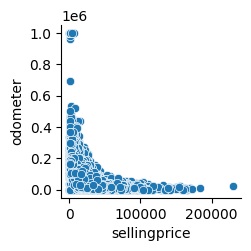

In [64]:
sns.pairplot(df_train_1,x_vars='sellingprice',y_vars = 'odometer')

In [65]:
df_train_1['sellingprice'].describe()

count             440,236.0
mean    13,592.230549069136
std      9,751.455933253334
min                   100.0
25%                 6,900.0
50%                12,100.0
75%                18,200.0
max               230,000.0
Name: sellingprice, dtype: float64

In [66]:
df_train_1['pr_group'] = pd.cut(df_train_1.sellingprice, [100,6900,12100,18200,230000],include_lowest=True)

In [67]:
pivot = pd.pivot_table(df_train_1,index=['pr_group'],values='odometer',aggfunc=['median'])

In [68]:
pivot

,median
,odometer
pr_group,
"(99.999, 6900.0]","125,731.0"
"(6900.0, 12100.0]","58,668.0"
"(12100.0, 18200.0]","35,972.0"
"(18200.0, 230000.0]","28,167.0"


In [69]:
df_train_1['pr_group'] = df_train_1['pr_group'].astype('string')
pr_gr = list(df_train_1['pr_group'].unique())

In [70]:
median_odo = {'(99.999, 6900.0]':125731.0,
              '(6900.0, 12100.0]':58668.0,
              '(12100.0, 18200.0]':35972.0,
              '(18200.0, 230000.0]':28167.0}


In [71]:
df_train_1['odometer_median'] = df_train_1['pr_group'].map(median_odo)

In [72]:
df_train_1.loc[(df_train_1['odometer'].isnull()),'odometer'] = df_train_1['odometer_median']

Missing values of condition column will be replaced with average values of condition from train data set based on price groups of cars. There is correlation between price and condition but the problem is that for cars in good condition selling price may be very diverse depending on a class of cars.

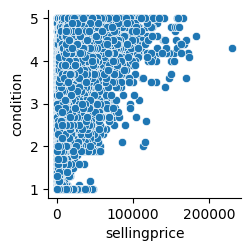

In [73]:
sns.pairplot(df_train_1,x_vars='sellingprice',y_vars = 'condition')

In [74]:
pivot = pd.pivot_table(df_train_1,index=['pr_group'],values='condition',aggfunc=['median'])
pivot

,median
,condition
pr_group,
"(12100.0, 18200.0]",3.9
"(18200.0, 230000.0]",4.2
"(6900.0, 12100.0]",3.5
"(99.999, 6900.0]",2.4


In [75]:
median_cond = {'(99.999, 6900.0]':2.4,
              '(6900.0, 12100.0]':3.5,
              '(12100.0, 18200.0]':3.9,
              '(18200.0, 230000.0]':4.2}

In [76]:
df_train_1['condition_median'] = df_train_1['pr_group'].map(median_cond)
df_train_1.loc[(df_train_1['condition'].isnull()),'condition'] = df_train_1['condition_median']

In [77]:
df_train_1.drop(columns=['condition_median','odometer_median','pr_group'],
               axis=1,inplace=True)

In [78]:
df_train_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440236 entries, 0 to 440235
Data columns (total 18 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   year           440236 non-null  datetime64[ns]
 1   make           440236 non-null  string        
 2   model          440236 non-null  string        
 3   trim           440236 non-null  string        
 4   body           440236 non-null  string        
 5   is_automatic   440236 non-null  bool          
 6   vin            440236 non-null  string        
 7   state          440236 non-null  string        
 8   condition      440236 non-null  float64       
 9   odometer       440236 non-null  float64       
 10  color          440236 non-null  string        
 11  interior       440236 non-null  string        
 12  seller         440236 non-null  string        
 13  sellingprice   440236 non-null  float64       
 14  saledate       440236 non-null  datetime64[ns]
 15  

Now odd redundant columns will be deleted - vin (since it is unique for each car and year/saledate columns since they are transformed into new age column.

In [79]:
df_train_1.drop(columns=['year','vin','saledate'],axis=1,inplace=True)

In [80]:
df_test_1.isnull().sum()

year             0
make             0
model            0
trim             0
body             0
is_automatic     0
vin              0
state            0
condition        0
odometer         0
color            0
interior         0
seller           0
saledate         0
age              0
month_of_sale    0
is_weekend       0
dtype: int64

In [81]:
feature_test = df_test_1.drop(columns=['year','vin','saledate'],axis=1).copy()

## Modelling

### Model specification

The model will be based on XGBoost Regressor. Analysis will be performed inside a Pipeline with encoding and embeded feature selection based on feature importance. Leave one out encoder will be used for string columns for deacresing error in mean calculation in contrast to simple mean target encoding. For odometer column robust scaler will be used to improve "normality" of data for fitting.

In [82]:
loo_enc = ['make','model','trim','body','state','color','interior','seller']
robust_scaler = ['odometer']

In [83]:
df_train_1[loo_enc] = df_train_1[loo_enc].astype('category')

In [84]:
feature_test[loo_enc] = feature_test[loo_enc].astype('category')

In [85]:

for col in robust_scaler:
    print(col)
    print(df_train_1[col].describe())
    print('---')

odometer
count             440,236.0
mean       68,350.831506283
std     53,542.207877043016
min                     1.0
25%                28,259.0
50%                52,103.0
75%                99,283.0
max               999,999.0
Name: odometer, dtype: float64
---


In [86]:
target = df_train_1['sellingprice']
features = df_train_1.drop(columns='sellingprice',axis=1)

In [87]:
X_train, X_test, y_train, y_test = train_test_split(features,target,test_size=0.2, random_state=rand_st)

In [88]:
loo = LeaveOneOutEncoder(handle_missing='value')
rs = RobustScaler()

In [89]:
preprocess = make_column_transformer(
    (loo, loo_enc),
    (rs, robust_scaler),
    remainder='passthrough'
)
estimator = XGBRegressor(learning_rate=0.05, max_depth=3, n_estimators=250, random_state=rand_st)
fs = SelectKBest(k=5)
selector = RFE(estimator, n_features_to_select=5, step=1)
steps = [
    ('preprocess', preprocess),
    ('select', fs),
    ('clf', estimator)
]
pipeline = Pipeline(steps)

In [90]:
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
pred_df = pd.DataFrame({'y': y_test,'y_pred': y_pred})
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)

0.3107612024855074


MAPE value for the model is not high but still can be better. Since odometer column has non liniar relationship with price the model may be improved by log tranformation of the target.

In [91]:
y_train_lg = np.log(y_train)
y_test_lg = np.log(y_test)

In [92]:
pipeline.fit(X_train, y_train_lg)
y_pred = pipeline.predict(X_test)
pred_df = pd.DataFrame({'y': y_test_lg,'y_pred': y_pred})
mape = mean_absolute_percentage_error(y_test_lg, y_pred)
print(mape)

0.028033368799164578


A considerable improvement of MAPE is evident. However the result is too good to be true. There is a high probability that the model is over learning. Nevertheless, the model will be enhanced using random search algorithm for parameters and checked on the test dataset. 

In [93]:
print(pred_df['y_pred'].describe())
pred_df['y_pred'] = np.exp(pred_df['y_pred'])
print(pred_df['y_pred'].describe())

count             88,048.0
mean     9.199898719787598
std      0.834566593170166
min      5.594832897186279
25%      8.814168214797974
50%      9.428333282470703
75%      9.750769138336182
max     11.574530601501465
Name: y_pred, dtype: float64
count              88,048.0
mean       12,847.396484375
std       8,103.91259765625
min       269.0326843261719
25%     6,728.9083251953125
50%       12,435.7822265625
75%       17,167.4287109375
max         106,354.2265625
Name: y_pred, dtype: float64


In [ ]:
param_grid = {
    'clf__learning_rate': np.arange(0.01, 1, 0.24),
    'clf__max_depth': np.arange(3,9,3),
    'clf__n_estimators': np.arange(1,1000,249)
}
rand_auc = RandomizedSearchCV(estimator=pipeline, 
                              param_distributions=param_grid, 
                              n_iter=5, 
                              scoring='neg_mean_absolute_percentage_error', 
                              cv=3, 
                              verbose=False)
rand_auc.fit(X_train, y_train_lg)
rand_auc.best_score_
y_pred = rand_auc.predict(X_test)
pred_df = pd.DataFrame({'y': y_test_lg,'y_pred': y_pred})
mape = mean_absolute_percentage_error(y_test_lg, y_pred)
print(mape)

After finetuning of parameters the model perfoms even better.

In [ ]:
y_pred_test = rand_auc.predict(feature_test)
pred_df = pd.DataFrame({'vin': df_test_1['vin'],'y_pred': y_pred_test})
print(pred_df.describe())
pred_df['y_pred'] = np.exp(pred_df['y_pred'])
print(pred_df.describe())

In [ ]:
pred_df.columns = ['vin','sellingprice']
# pred_df.to_csv('output.csv', index=False)

Prediction of prices on the test dataset in Kaggle resulted in MAPE of 24% which means that 3/4 of all data points are predicted correcly.

### multiculliniarity and heteroskedasticity analysis

Multiculliniarity test will be performed by calculating the variance inflation factor (VIF). The rule of thumb is that thr VIF value greater than 5 indicated high correlation between features.

Heteroskedasticity will be checked with the help of Breusch-Pagan test and plotting residuals versus predicted values. 

In [ ]:
encoded_features = loo.fit_transform(X_train[loo_enc],np.log(y_train))
scaled_features = pd.DataFrame(rs.fit_transform(X_train[robust_scaler])).reindex(index=X_train[robust_scaler].index)

In [ ]:
scaled_features.columns = ['odometer']

In [ ]:
scaled_features.isnull().sum()

In [ ]:
x_train_comb = pd.concat([encoded_features, scaled_features], axis=1)


In [ ]:
x_train_comb.isnull().sum()

In [ ]:
X_train_notenc = X_train.copy()

In [ ]:
X_train_notenc.drop(columns=['make', 'model', 'trim', 'body','state','color', 'interior', 'seller'],inplace=True,axis=1)

In [ ]:
x_train_comb = pd.concat([x_train_comb, X_train_notenc], axis=1)

In [ ]:
train_df_enc = pd.concat([x_train_comb, y_train], axis=1)

In [ ]:
train_df_enc.columns

In [ ]:
train_df_enc['sellingprice'] = np.log(train_df_enc['sellingprice'])

In [ ]:
y, X = dmatrices('sellingprice ~ make+model+trim+body+state+color+interior+seller+odometer+is_automatic+condition+odometer+age+month_of_sale+is_weekend', data=train_df_enc, return_type='dataframe')

#create DataFrame to hold VIF values
vif_df = pd.DataFrame()
vif_df['variable'] = X.columns 

#calculate VIF for each predictor variable 
vif_df['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

#view VIF for each predictor variable 
print(vif_df)

As VIF is lower than 5 for each column - there is no multiculliniarity.

In [ ]:

residuals = y_test_lg - y_pred

fig, axs = plt.subplots(1, 1, figsize=(8, 6))
axs.scatter(y_pred, residuals)
axs.axhline(0, color='red', linestyle='--')
axs.set_xlabel('Predicted Values')
axs.set_ylabel('Residuals')
axs.set_title('Residuals vs Predicted Values')

plt.tight_layout()
plt.show()

It can be seen from residuals plot that heteroskedasticity is moderate for the model.